## SRM INSTITUTE OF SCIENCE AND TECHNOLOGY

### 20PAIE51J- MACHINE LEARNING (UNSUPERVISED MODEL)

Hiearchial Clustering

a. Import required Library



In [149]:
# 'Pandas' 
import pandas as pd 

# 'Numpy' 
import numpy as np

# 'SciPy'
from scipy.stats import norm 

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt

import pylab as pyl

from sklearn.preprocessing import StandardScaler

b. Read the dataset (tab, csv, xls, txt, inbuilt dataset).


In [150]:
df_forestfirees = pd.read_csv("MPA-1_forestfires.csv", index_col=False)
df_forestfirees.head(5)

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0


c. Perform explanotory data analysis on the dataset.

In [151]:
df_forestfirees.dtypes

X          int64
Y          int64
month     object
day       object
FFMC     float64
DMC      float64
DC       float64
ISI      float64
temp     float64
RH         int64
wind     float64
rain     float64
area     float64
dtype: object

In [152]:
df_forestfirees.describe()

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,4.669246,4.299807,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292
std,2.313778,1.229900,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818
min,1.000000,2.000000,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000
25%,3.000000,4.000000,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000
50%,4.000000,4.000000,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000
75%,7.000000,5.000000,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000
max,9.000000,9.000000,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000


In [153]:
df_forestfirees.shape

(517, 13)

In [154]:
numerical_columns = ["X", "Y", "FFMC", "DMC","DC", "ISI", "temp", "RH", "wind", "rain", "area"]


In [155]:
#Finding skewness and kurtosis in the dataset 
print("Skew: \n{}".format(df_forestfirees.skew()))
print("Kurtosis: \n{}".format(df_forestfirees.kurtosis()))

Skew: 
X        0.036246
Y        0.417296
FFMC    -6.575606
DMC      0.547498
DC      -1.100445
ISI      2.536325
temp    -0.331172
RH       0.862904
wind     0.571001
rain    19.816344
area    12.846934
dtype: float64
Kurtosis: 
X        -1.172331
Y         1.420553
FFMC     67.066041
DMC       0.204822
DC       -0.245244
ISI      21.458037
temp      0.136166
RH        0.438183
wind      0.054324
rain    421.295964
area    194.140721
dtype: float64


C:\Users\bhara\AppData\Local\Temp\ipykernel_13272\2617557212.py:2: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  print("Skew: \n{}".format(df_forestfirees.skew()))
C:\Users\bhara\AppData\Local\Temp\ipykernel_13272\2617557212.py:3: FutureWarning: The default value of numeric_only in DataFrame.kurt is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  print("Kurtosis: \n{}".format(df_forestfirees.kurtosis()))


**Inference:** The data is highly skewed.</br>'ISI', & 'rain' and 'area' have +ve skewness, value more than +1 so, they are right skewed.</br>
     'FFMC', & 'temp' have -ve skewness, value less than -1 so, they are left skewed.</br>
        'FFMC', 'ISI', & 'rain' and 'area' have higher kurtosis value. i,e have outliers.

Feature columns with (high, +ve, or -ve) outliers, skewness and kurtosis are:

**FFMC - ISI - rain - area**

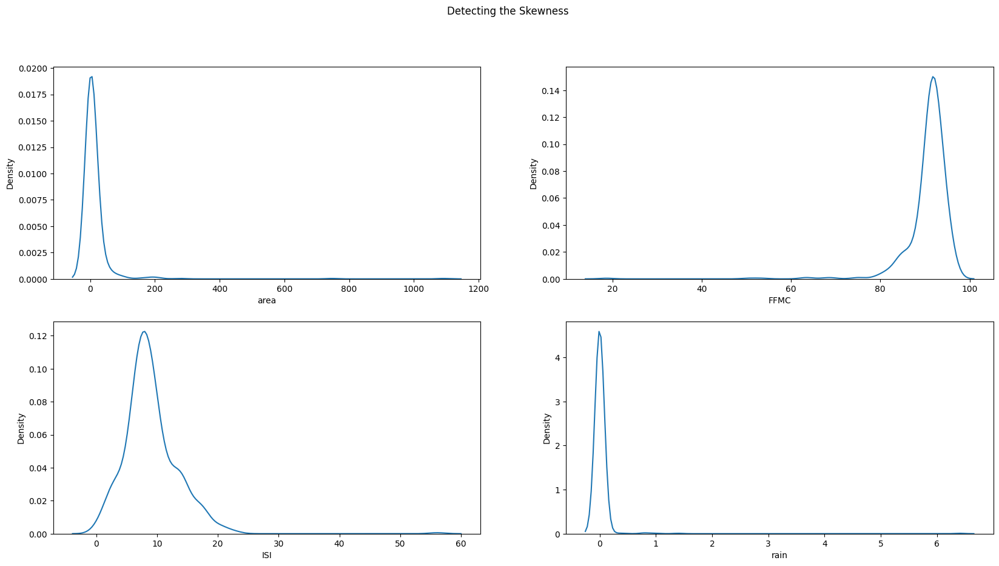

In [156]:
fig, axes = plt.subplots(figsize=(20,10), ncols=2, nrows=2)
fig.suptitle('Detecting the Skewness')
sns.kdeplot(df_forestfirees["area"], ax=axes[0,0])
sns.kdeplot(df_forestfirees["FFMC"], ax=axes[0,1])
sns.kdeplot(df_forestfirees["ISI"], ax=axes[1,0])
sns.kdeplot(df_forestfirees["rain"], ax=axes[1,1])
plt.show()

In [157]:
outlier_columns = ['area','FFMC','ISI','rain']

In [158]:
df_forestfirees[outlier_columns].describe()

,area,FFMC,ISI,rain
count,517.000000,517.000000,517.000000,517.000000
mean,12.847292,90.644681,9.021663,0.021663
std,63.655818,5.520111,4.559477,0.295959
min,0.000000,18.700000,0.000000,0.000000
25%,0.000000,90.200000,6.500000,0.000000
50%,0.520000,91.600000,8.400000,0.000000
75%,6.570000,92.900000,10.800000,0.000000
max,1090.840000,96.200000,56.100000,6.400000


In [159]:
np.log1p(df_forestfirees[outlier_columns]).skew()

area     1.217838
FFMC   -11.675394
ISI     -0.937218
rain    14.173028
dtype: float64

In [160]:
np.log1p(df_forestfirees[outlier_columns]).kurtosis()

area      0.945668
FFMC    185.482383
ISI       2.584588
rain    234.240025
dtype: float64

In [161]:
df_forestfirees[outlier_columns].head(5)

,area,FFMC,ISI,rain
0,0.0,86.2,5.1,0.0
1,0.0,90.6,6.7,0.0
2,0.0,90.6,6.7,0.0
3,0.0,91.7,9.0,0.2
4,0.0,89.3,9.6,0.0


Even after transformation we still have high skewness and kurtosis in FFMC & rain.Hence removing outliers by zscore method.

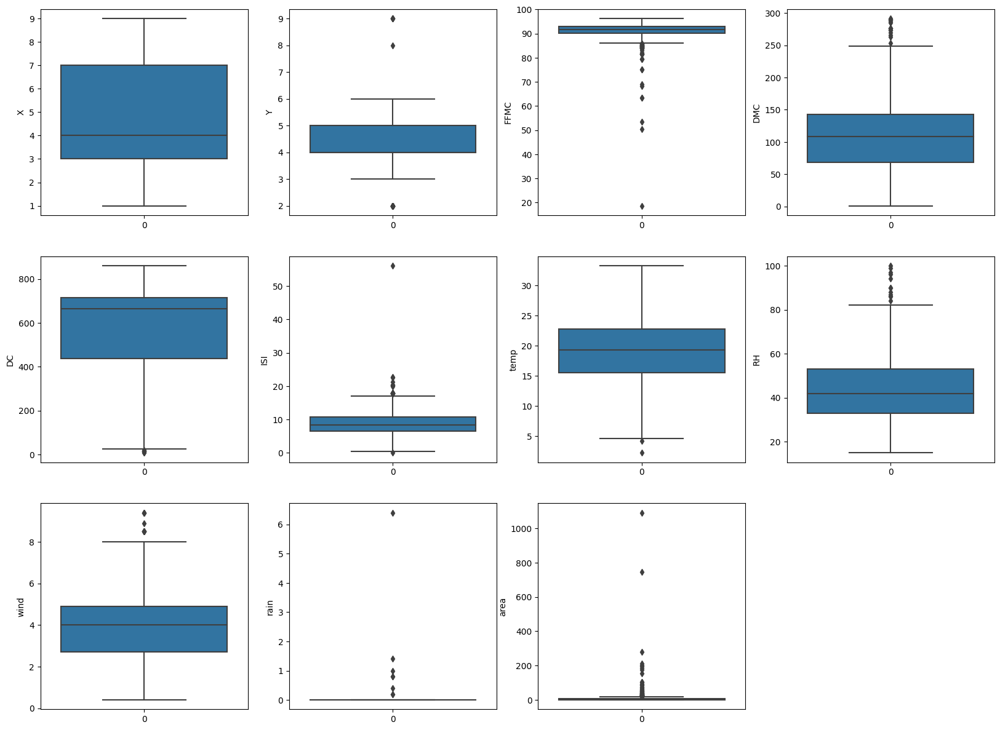

In [162]:

plt.figure(figsize=(20,20))
i=1
for column in numerical_columns:
    plt.subplot(4,4,i)
    sns.boxplot(df_forestfirees[column])
    plt.ylabel(column)
    i = i+1

In [163]:
#Finding outliers

for columns in numerical_columns:
    outliers = []
    q1 = np.percentile(df_forestfirees[columns], 25)
    q3 = np.percentile(df_forestfirees[columns], 75)
    IQR = q3 - q1
    lwr_bound = q1-(1.5*IQR)
    upr_bound = q3 + (1.5*IQR)
    for i in df_forestfirees[columns]:
        if (i<lwr_bound or i> upr_bound):
            outliers.append(i)
    print("There are ", len(outliers), "outliers in the variable", columns )

There are  0 outliers in the variable X
There are  51 outliers in the variable Y
There are  53 outliers in the variable FFMC
There are  17 outliers in the variable DMC
There are  8 outliers in the variable DC
There are  23 outliers in the variable ISI
There are  2 outliers in the variable temp
There are  12 outliers in the variable RH
There are  13 outliers in the variable wind
There are  8 outliers in the variable rain
There are  63 outliers in the variable area


In [164]:
#Replacing outlier for FFMC, ISI, Area with lower bound and upper bound values


for columns in numerical_columns:
    if columns == "FFMC" or columns == "ISI" or columns == "area" or columns=="rain":
        outliers = []
        q1 = np.percentile(df_forestfirees[columns], 25)
        q3 = np.percentile(df_forestfirees[columns], 75)
        IQR = q3 - q1
        lwr_bound = q1-(1.5*IQR)
        upr_bound = q3 + (1.5*IQR)
        for row_n, i in enumerate(df_forestfirees[columns]):
            if (i<lwr_bound):
                df_forestfirees.at[row_n, columns] = lwr_bound

            elif (i> upr_bound):
                df_forestfirees.at[row_n, columns] = upr_bound

In [165]:
#Finding outliers Again

for columns in numerical_columns:
    outliers = []
    q1 = np.percentile(df_forestfirees[columns], 25)
    q3 = np.percentile(df_forestfirees[columns], 75)
    IQR = q3 - q1
    lwr_bound = q1-(1.5*IQR)
    upr_bound = q3 + (1.5*IQR)
    for i in df_forestfirees[columns]:
        if (i<lwr_bound or i> upr_bound):
            outliers.append(i)
    print("There are ", len(outliers), "outliers in the variable", columns )

There are  0 outliers in the variable X
There are  51 outliers in the variable Y
There are  0 outliers in the variable FFMC
There are  17 outliers in the variable DMC
There are  8 outliers in the variable DC
There are  0 outliers in the variable ISI
There are  2 outliers in the variable temp
There are  12 outliers in the variable RH
There are  13 outliers in the variable wind
There are  0 outliers in the variable rain
There are  0 outliers in the variable area


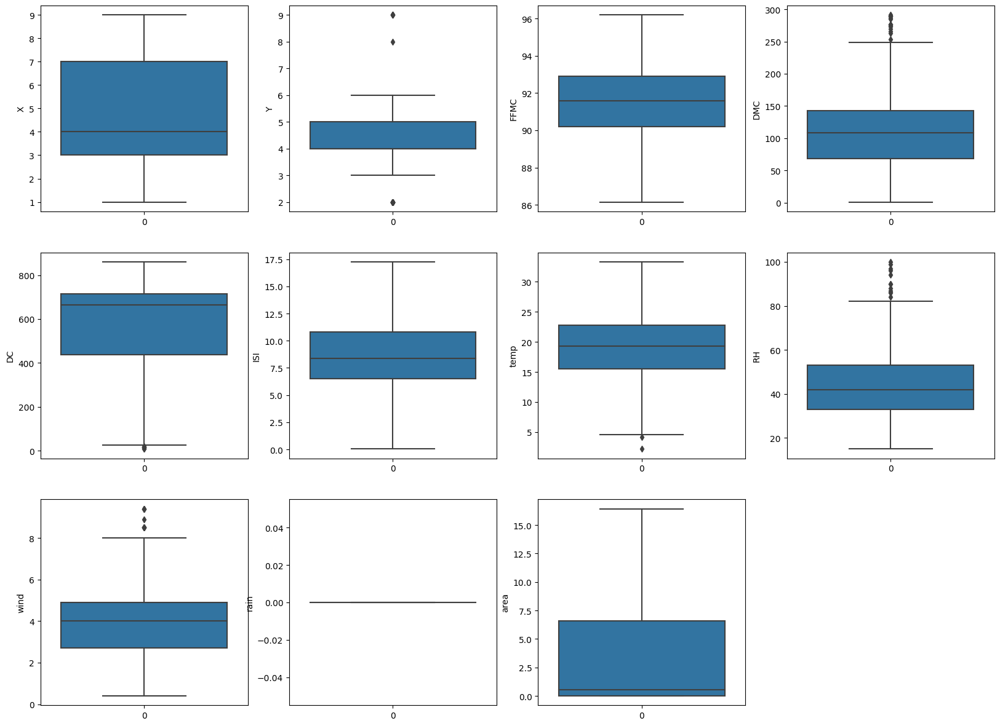

In [166]:
#plotting boxplot to check the outliers 


plt.figure(figsize=(20,20))
i=1
for column in numerical_columns:
    plt.subplot(4,4,i)
    sns.boxplot(df_forestfirees[column])
    plt.ylabel(column)
    i = i+1

In [167]:
#Checking if there is null values in the dataset 

df_forestfirees.isnull().value_counts()

X      Y      month  day    FFMC   DMC    DC     ISI    temp   RH     wind   rain   area 
False  False  False  False  False  False  False  False  False  False  False  False  False    517
dtype: int64

In [168]:
#Replacing the month from categorical data to numerical data 

temp_month = {
    'jan' : 1,
    'feb' : 2,
    'mar' : 3, 
    'apr' : 4,
    'may' : 5,
    'jun' : 6,
    'jul' : 7,
    'aug' : 8,
    'sep' : 9,
    'oct' : 10,
    'nov' : 11,
    'dec' :12
}
temp_day = {'sun' : 1, 'mon' : 2, 'tue' : 3, 'wed' : 4, 'thu' : 5, 'fri' : 6, 'sat' : 7}

In [169]:
df_forestfirees["month"] = df_forestfirees.month.map(temp_month)
df_forestfirees["day"] = df_forestfirees.day.map(temp_day)
df_forestfirees.head(5)

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,3,6,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0
1,7,4,10,3,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0
2,7,4,10,7,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0
3,8,6,3,6,91.7,33.3,77.5,9.0,8.3,97,4.0,0.0,0.0
4,8,6,3,1,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0


In [170]:
# # Dropping day column since it is not necessary 

# df_forestfirees = df_forestfirees.drop('day', axis=1)
# df_forestfirees.head(2)

d. Plot the datapoints using Scatter Plot. 

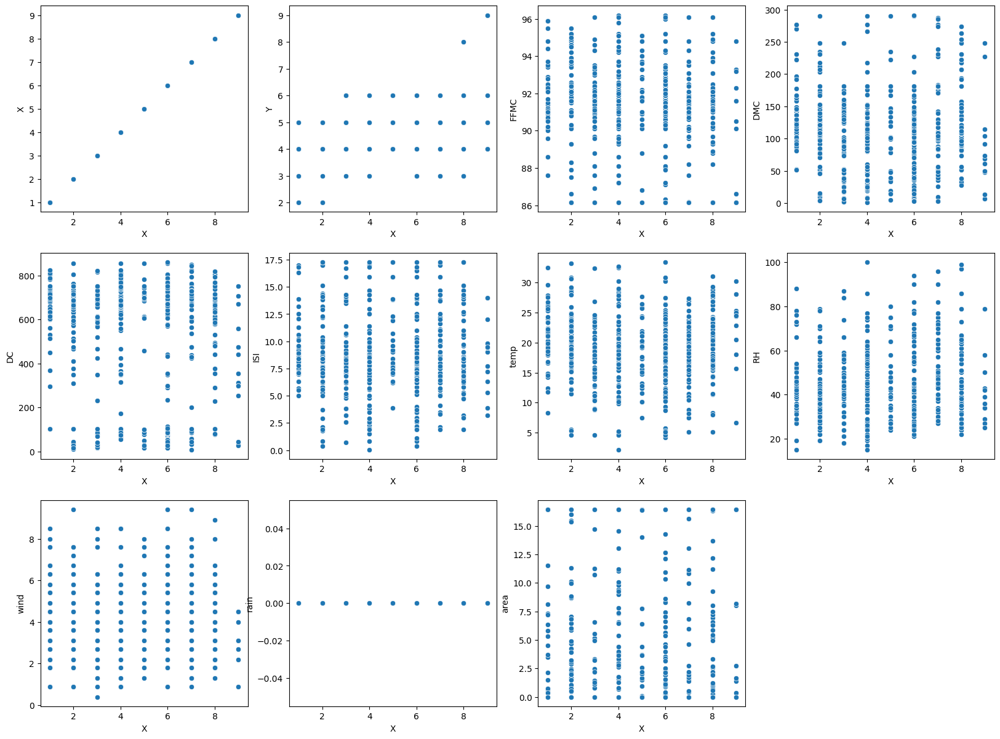

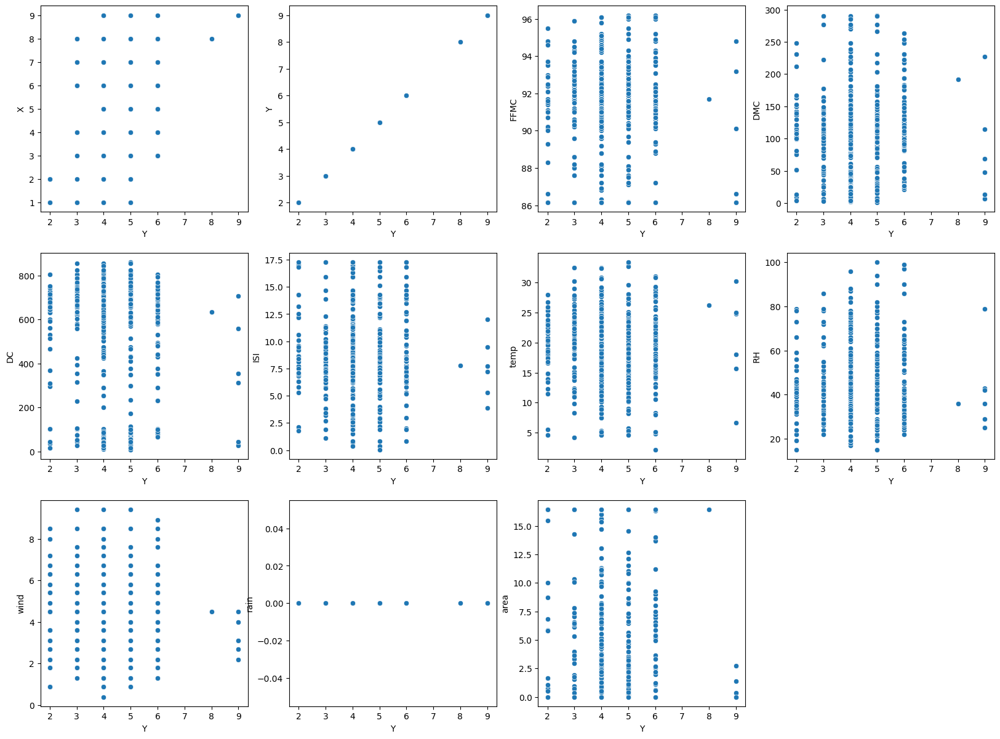

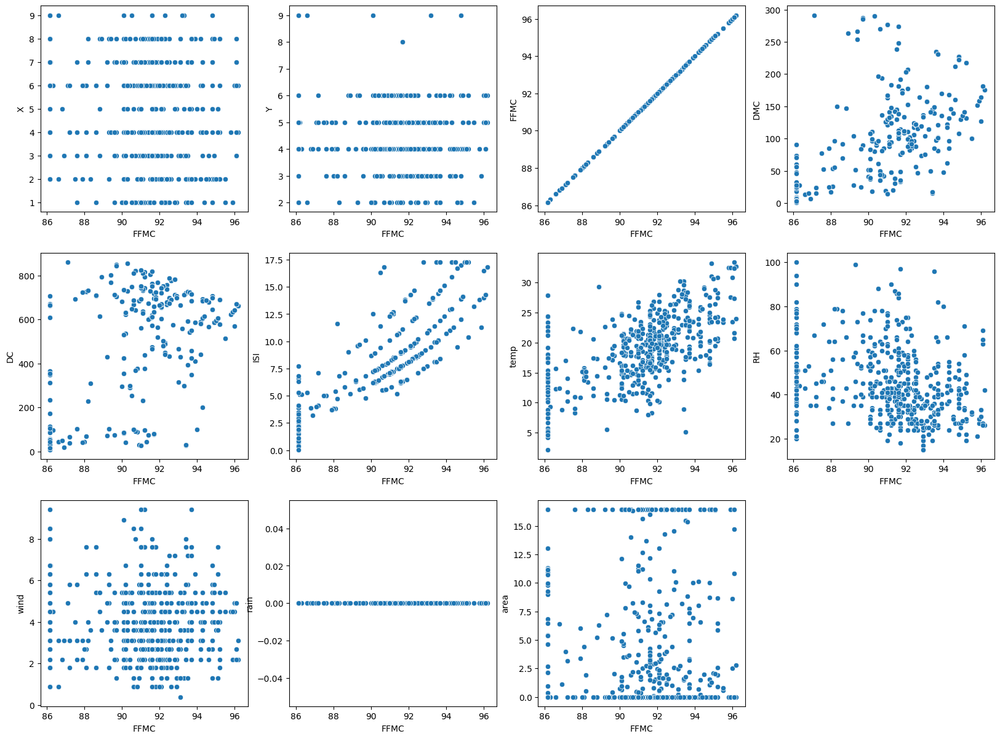

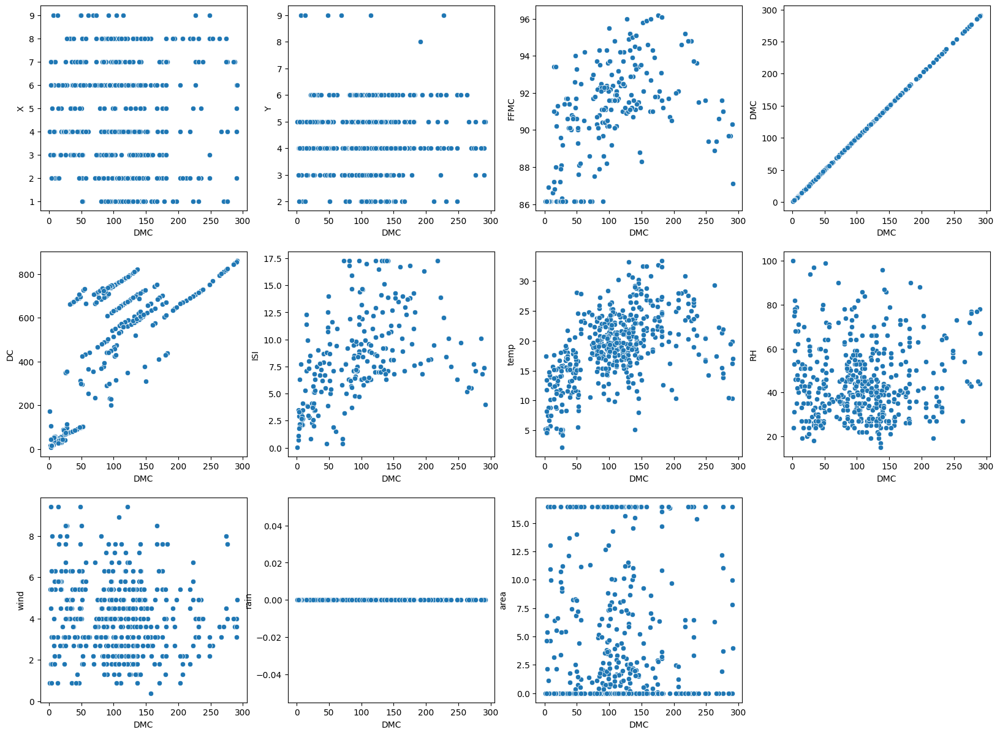

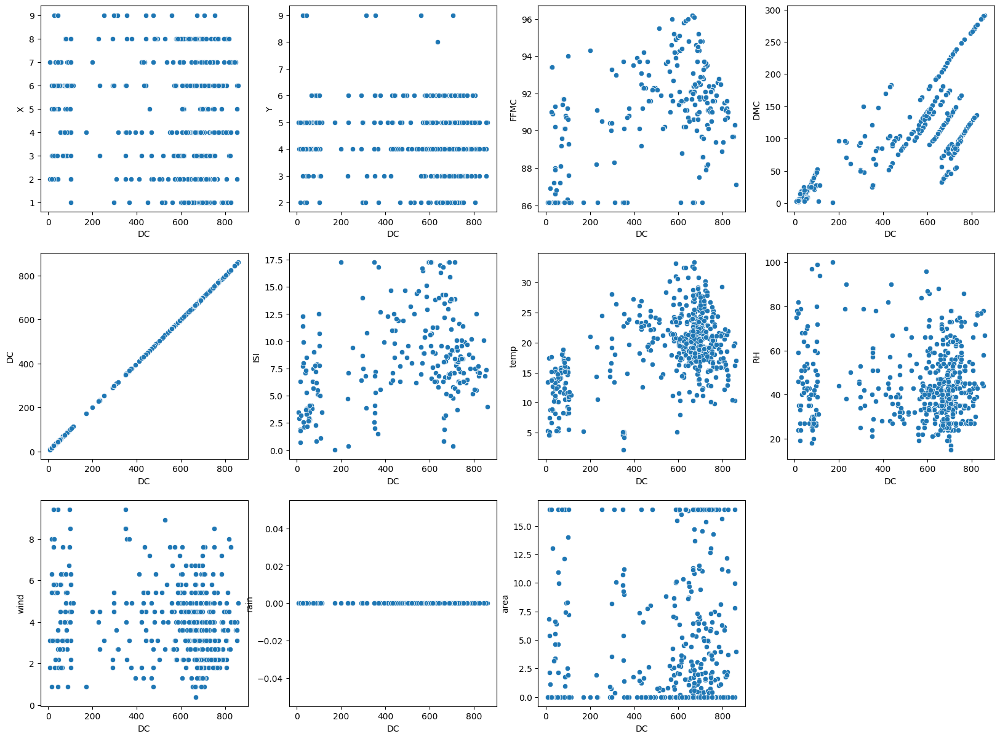

...

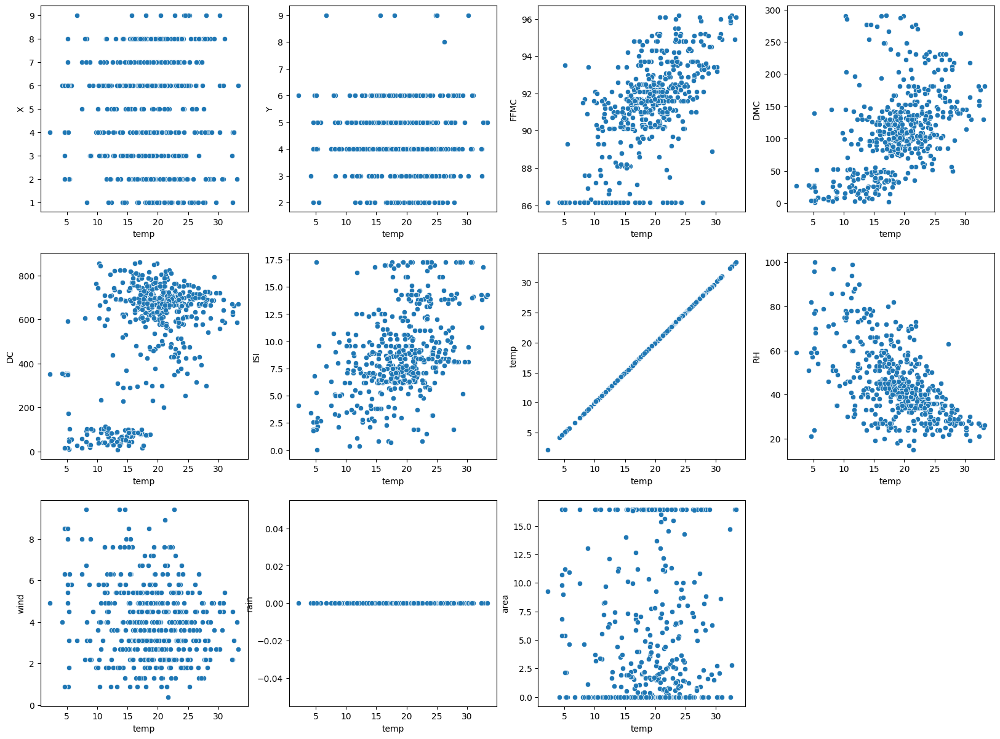

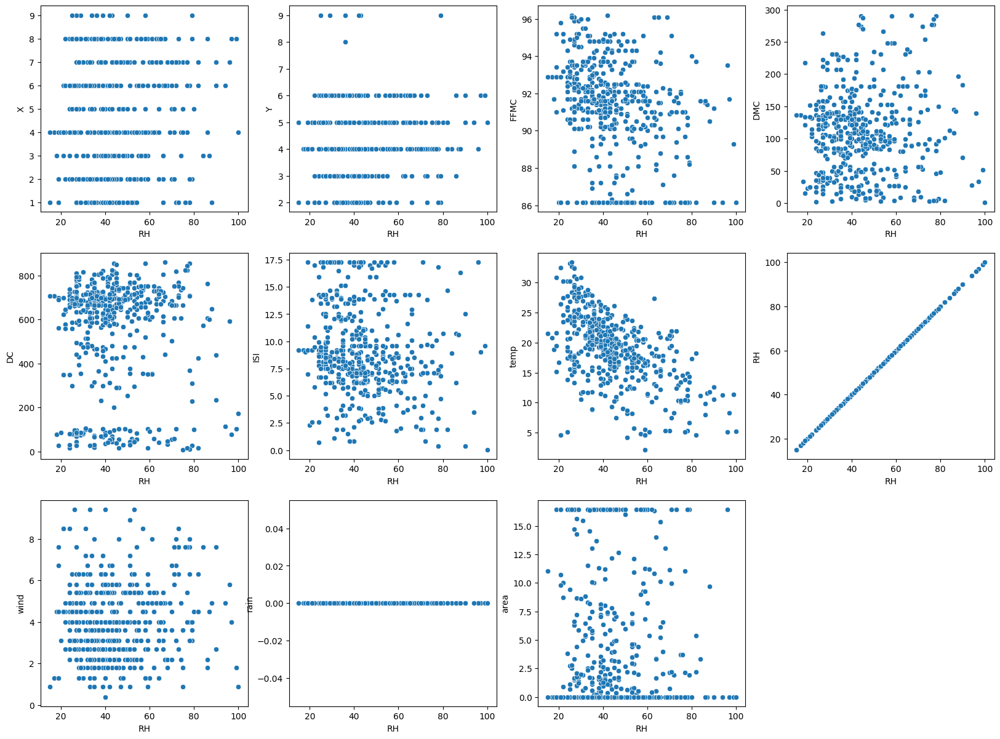

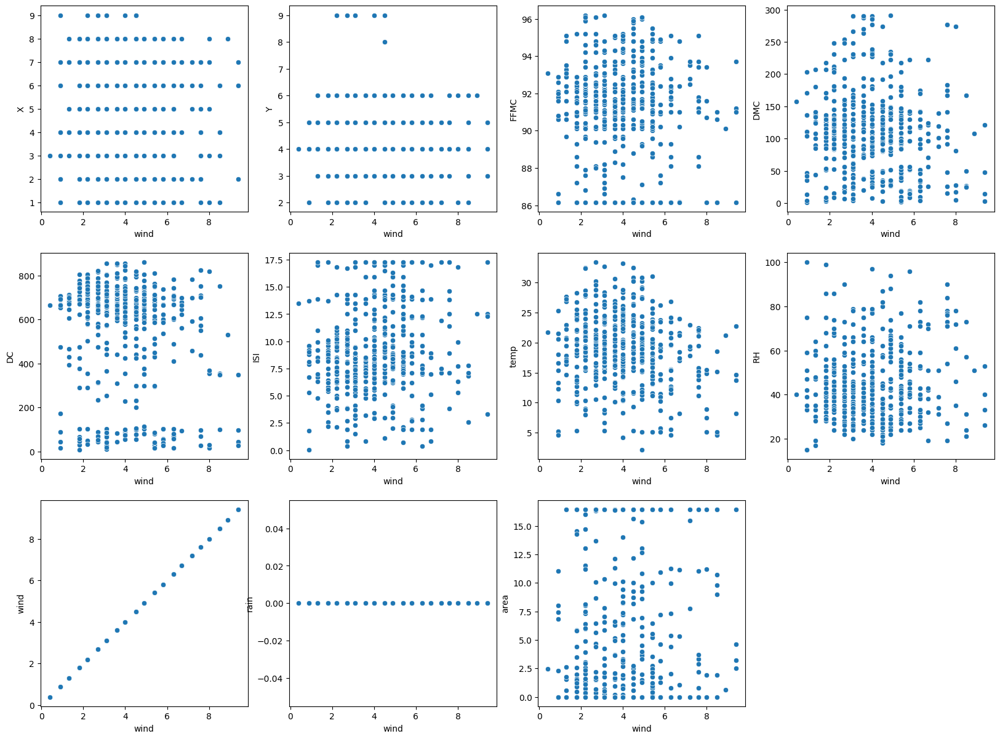

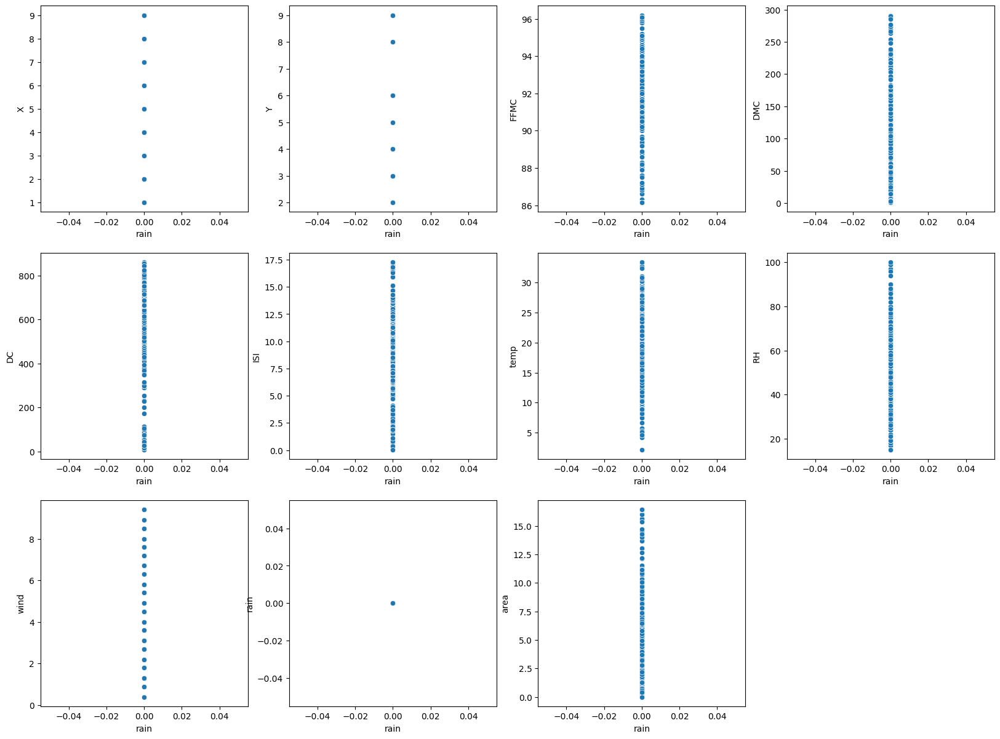

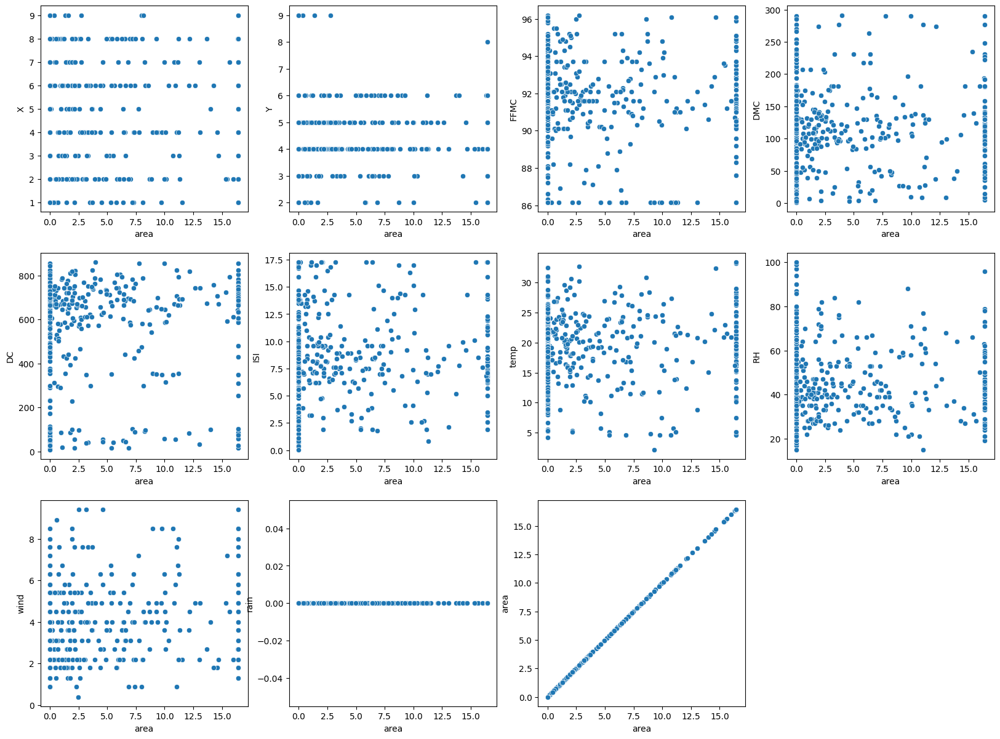

In [171]:
for column_x in numerical_columns:
    plt.figure(figsize=(20,20))
    i=1
    for column_y in numerical_columns:
        plt.subplot(4,4,i)
        sns.scatterplot(x=df_forestfirees[column_x], y=df_forestfirees[column_y])
        i = i+1

In [172]:
scaled_columns = ["X", "Y", "month", "day", "FFMC", "DMC", "DC", "ISI", "temp", "RH", "wind", "rain", "area"]

#Normalization

std_scalar = StandardScaler()
scaled_var = std_scalar.fit_transform(df_forestfirees)
df_forest_f_scaled = pd.DataFrame(scaled_var, columns = scaled_columns)

In [173]:
df_forest_f_scaled.head(3)

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,1.008313,0.569860,-1.968443,0.946441,-2.023755,-1.323326,-1.830477,-0.971788,-1.842640,0.411724,1.498614,0.0,-0.696673
1,1.008313,-0.244001,1.110120,-0.454255,-0.278531,-1.179541,0.488891,-0.559328,-0.153278,-0.692456,-1.741756,0.0,-0.696673
2,1.008313,-0.244001,1.110120,1.413339,-0.278531,-1.049822,0.560715,-0.559328,-0.739383,-0.692456,-1.518282,0.0,-0.696673


e. Apply five methods of agglomerative hierachial clustering. [Single, complete, average, centroid and ward's linkage method]

In [174]:
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet

Z1 = linkage(df_forest_f_scaled, method='single', metric='euclidean')
Z2 = linkage(df_forest_f_scaled, method='complete', metric='euclidean')
Z3 = linkage(df_forest_f_scaled, method='average', metric='euclidean')
Z4 = linkage(df_forest_f_scaled, method='centroid', metric='euclidean')
Z5 = linkage(df_forest_f_scaled, method='ward', metric='euclidean')

print("Method = Single \n\n",Z1," \n")
print("Method = Completed \n\n",Z2," \n")
print("Method = Average \n\n",Z3," \n")
print("Method = Centroid \n\n",Z4," \n")
print("Method = Ward \n\n",Z5," \n")

Method = Single 

 [[ 302.          303.            0.            2.        ]
 [  52.           53.            0.            2.        ]
 [  99.          100.            0.            2.        ]
 ...
 [ 469.         1029.            3.36173141  507.        ]
 [1017.         1030.            3.50743337  516.        ]
 [ 211.         1031.            3.52833378  517.        ]]  

Method = Completed 

 [[  52.           53.            0.            2.        ]
 [  99.          100.            0.            2.        ]
 [ 214.          215.            0.            2.        ]
 ...
 [1026.         1028.            8.75257526  106.        ]
 [1012.         1030.            9.14095832  110.        ]
 [1029.         1031.           10.46150852  517.        ]]  

Method = Average 

 [[  99.          100.            0.            2.        ]
 [ 302.          303.            0.            2.        ]
 [  52.           53.            0.            2.        ]
 ...
 [1016.         1029.          

f. Draw dendrogram for the above five clustering methods.

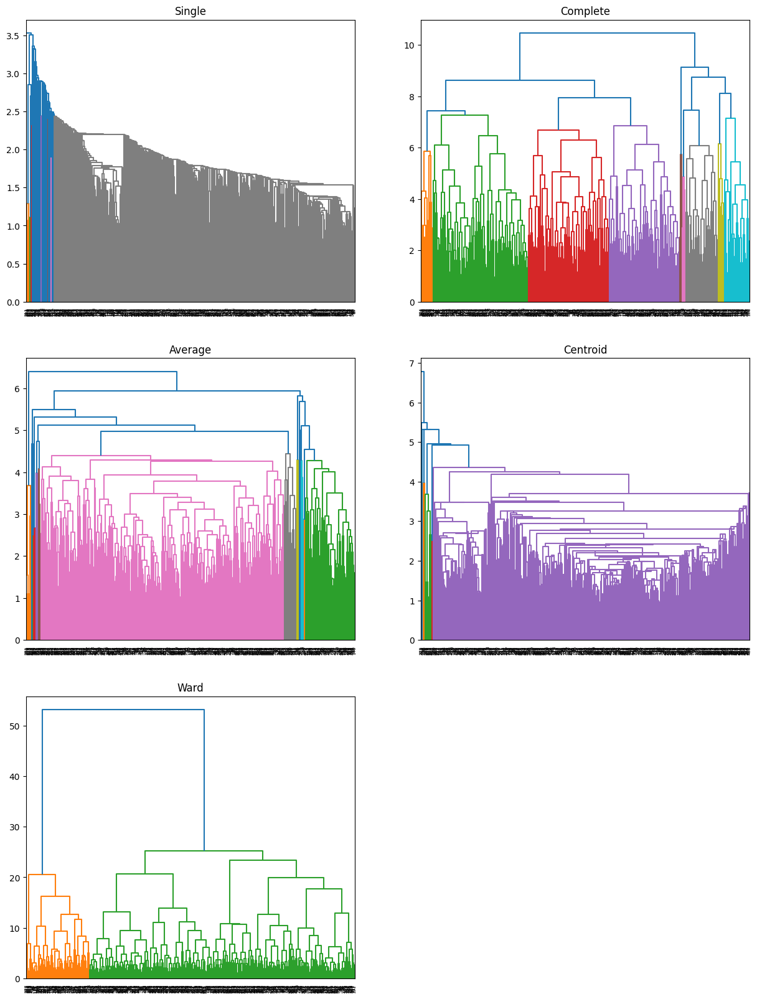

In [175]:
plt.figure(figsize=(15, 20))
plt.subplot(3,2,1), dendrogram(Z1), plt.title('Single')
plt.subplot(3,2,2), dendrogram(Z2), plt.title('Complete')
plt.subplot(3,2,3), dendrogram(Z3), plt.title('Average')
plt.subplot(3,2,4), dendrogram(Z4), plt.title('Centroid')
plt.subplot(3,2,5), dendrogram(Z5), plt.title('Ward')
plt.show()

g. Calculate Cophenet Coorelation coefficient for the above five methods.

In [176]:
from scipy.spatial.distance import pdist

c1, coph_dist = cophenet(Z1, pdist(df_forest_f_scaled, 'euclidean'))
c2, coph_dist = cophenet(Z2, pdist(df_forest_f_scaled, 'euclidean'))
c3, coph_dist = cophenet(Z3, pdist(df_forest_f_scaled, 'euclidean'))
c4, coph_dist = cophenet(Z4, pdist(df_forest_f_scaled, 'euclidean'))
c5, coph_dist = cophenet(Z5, pdist(df_forest_f_scaled, 'euclidean'))

print("Single Linkage (cophenetic correlation)", c1)
print("Complete Linkage (cophenetic correlation)", c2)
print("Average Linkage (cophenetic correlation)", c3)
print("centroid Linkage (cophenetic correlation)", c4)
print("ward Linkage (cophenetic correlation)", c5)

Single Linkage (cophenetic correlation) 0.6187573087734364
Complete Linkage (cophenetic correlation) 0.6225907732391255
Average Linkage (cophenetic correlation) 0.7497255874201327
centroid Linkage (cophenetic correlation) 0.7420219276855868
ward Linkage (cophenetic correlation) 0.6628047925876188


In [181]:
from sklearn.cluster import AgglomerativeClustering

y_pred = AgglomerativeClustering(n_clusters=3, linkage='average')

y_pred.fit_predict(df_forest_f_scaled)

print(y_pred.labels_)

[0 2 2 0 0 2 2 2 2 2 2 2 2 2 2 2 0 2 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 0 2 2 2 2 2 2 2 2 0 0 2 2 2 2 2 2 2 2 0 0 0 0 2 2 2 2 2 2 2 0 0 2 0 2
 2 0 0 0 2 2 2 2 2 2 2 2 2 2 2 0 2 0 2 2 2 2 0 0 2 2 2 2 2 2 0 0 0 2 2 2 0
 0 2 2 0 0 0 0 0 2 2 2 2 2 2 2 0 2 2 2 0 0 0 2 0 2 2 2 0 2 2 2 2 2 2 2 0 2
 2 2 2 0 2 2 2 2 2 2 2 2 0 2 0 2 2 0 2 2 0 2 2 2 2 2 2 2 0 2 2 2 2 2 0 2 2
 2 0 2 0 0 0 2 2 2 2 2 0 2 2 2 2 0 0 2 0 2 2 2 2 2 2 2 2 0 0 0 2 2 2 0 2 2
 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 0 0 0 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 0 2 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 0 0 2 2 2 2 2 2 2 0 2 2 0 2 2 0 0 0 2 2 2 2 2 2 2 2 2 2 2
 0 2 2 0 0 2 2 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 2
 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 2 0 2 0 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 

In [182]:
df_forest_f_scaled['Cluster'] = y_pred.labels_

df_forest_f_scaled.head(5)

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,Cluster
0,1.008313,0.569860,-1.968443,0.946441,-2.023755,-1.323326,-1.830477,-0.971788,-1.842640,0.411724,1.498614,0.0,-0.696673,0
1,1.008313,-0.244001,1.110120,-0.454255,-0.278531,-1.179541,0.488891,-0.559328,-0.153278,-0.692456,-1.741756,0.0,-0.696673,2
2,1.008313,-0.244001,1.110120,1.413339,-0.278531,-1.049822,0.560715,-0.559328,-0.739383,-0.692456,-1.518282,0.0,-0.696673,2
3,1.440925,1.383722,-1.968443,0.946441,0.157774,-1.212361,-1.898266,0.033582,-1.825402,3.233519,-0.009834,0.0,-0.696673,0
4,1.440925,1.383722,-1.968443,-1.388053,-0.794166,-0.931043,-1.798600,0.188254,-1.291012,3.356206,-1.238940,0.0,-0.696673,0


In [183]:
# check the size of each cluster
df_forest_f_scaled['Cluster'].value_counts()

2    416
0     92
1      9
Name: Cluster, dtype: int64

h. Plot the best method labels using the scatter plot.

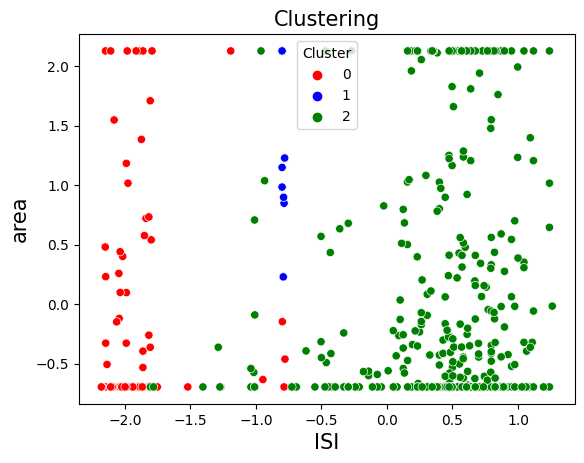

In [185]:
# plot the scatterplot to visualize the clusters
sns.scatterplot(x = 'DC', y = 'area', data = df_forest_f_scaled, hue = 'Cluster', palette=['red','blue', 'green'])

# set the axes and plot labels
# set the font size using 'fontsize'
plt.title('Clustering', fontsize = 15)
plt.xlabel('ISI', fontsize = 15)
plt.ylabel('area', fontsize = 15)

# display the plot
plt.show()

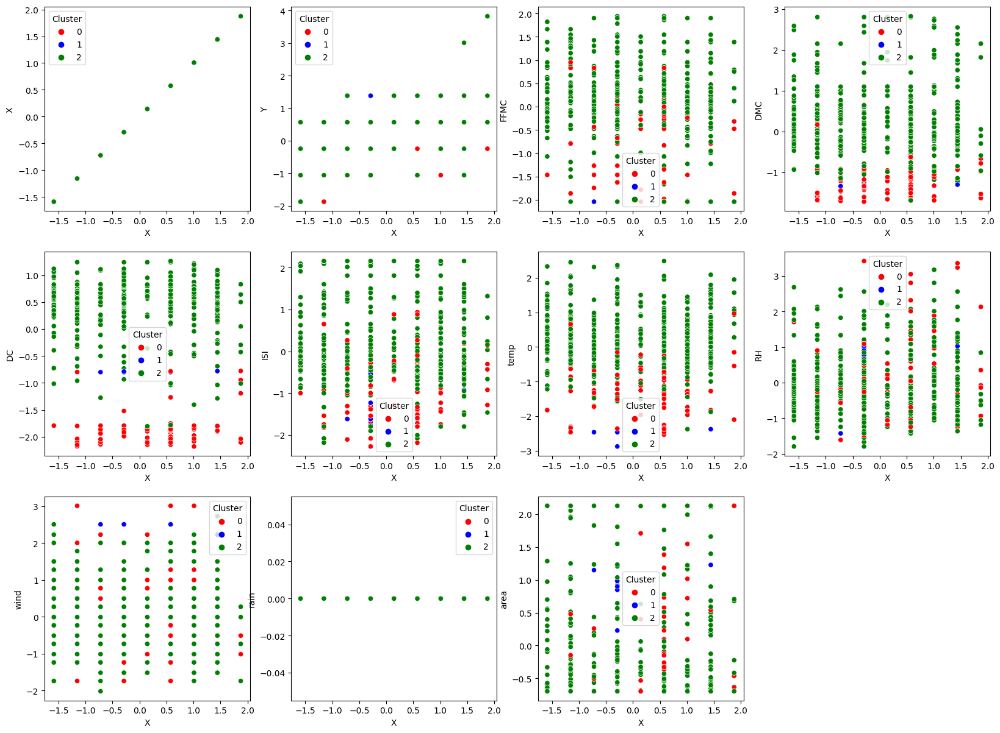

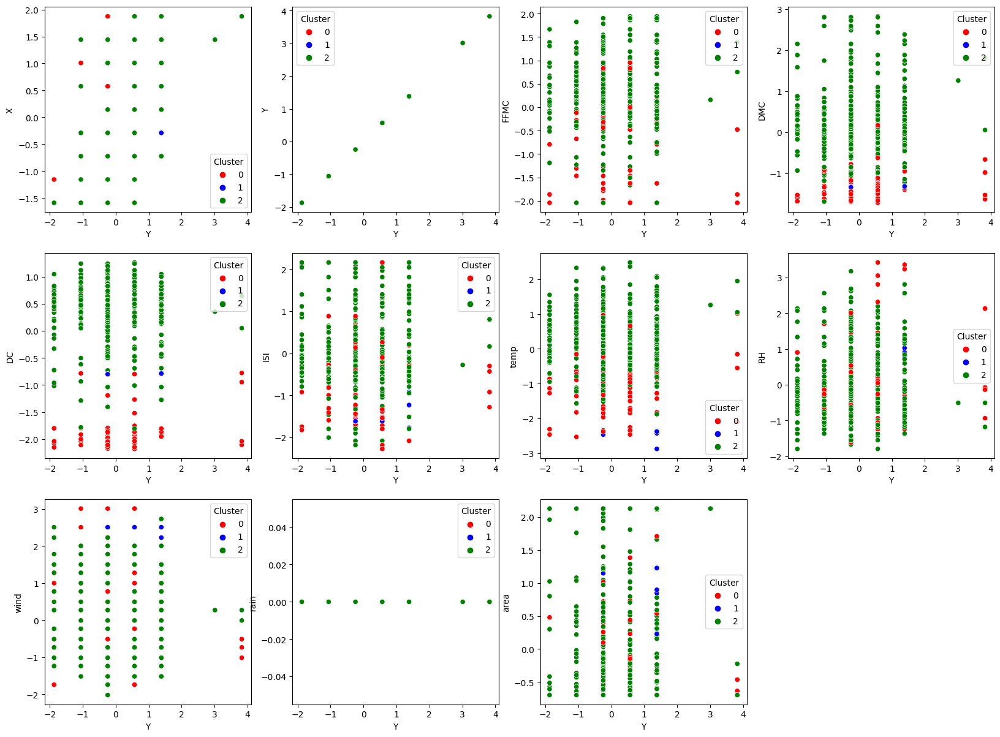

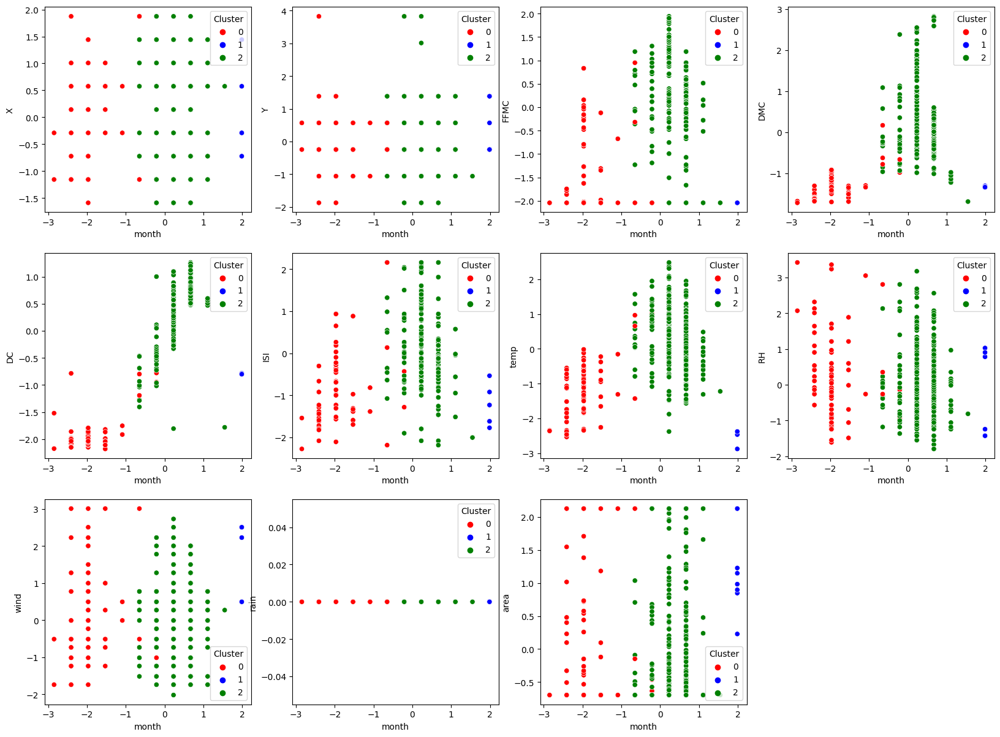

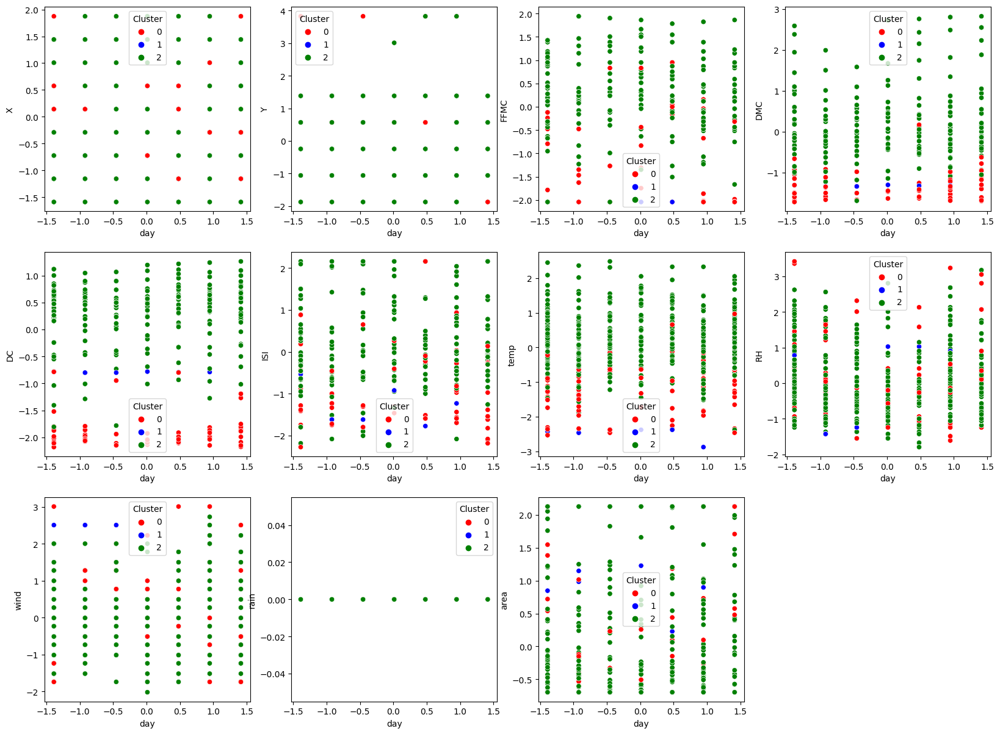

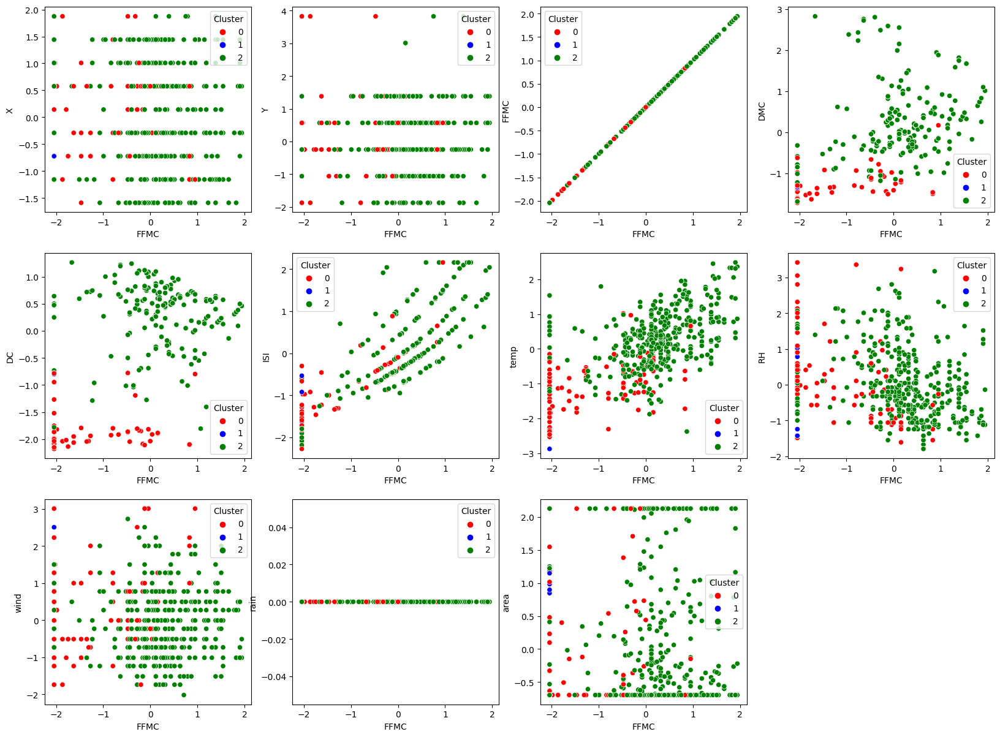

...

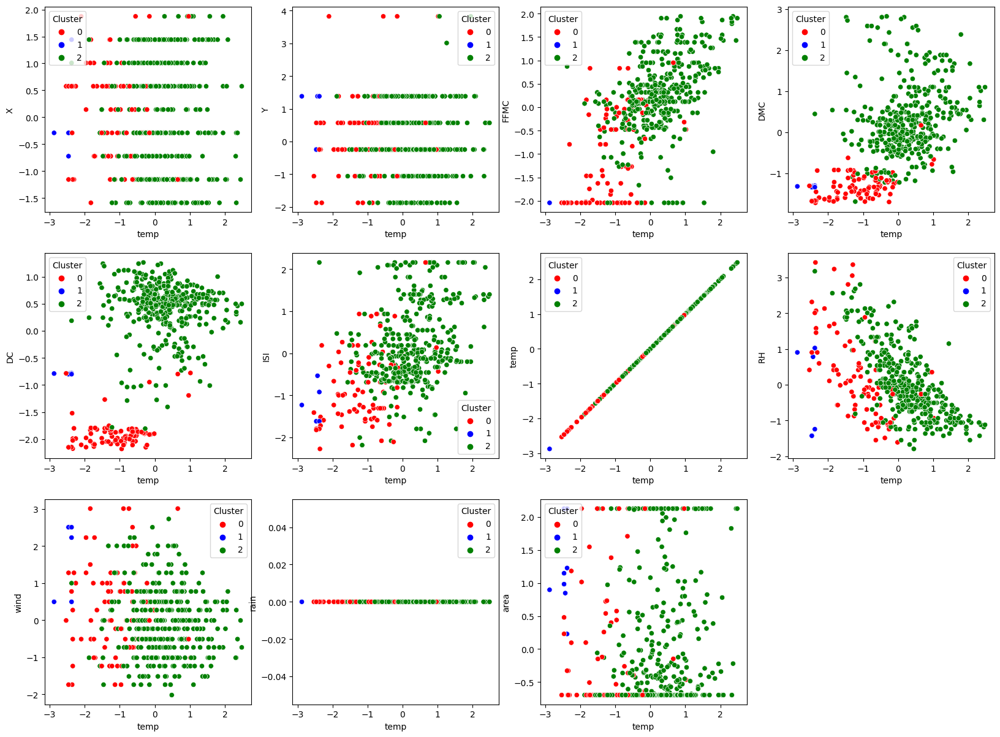

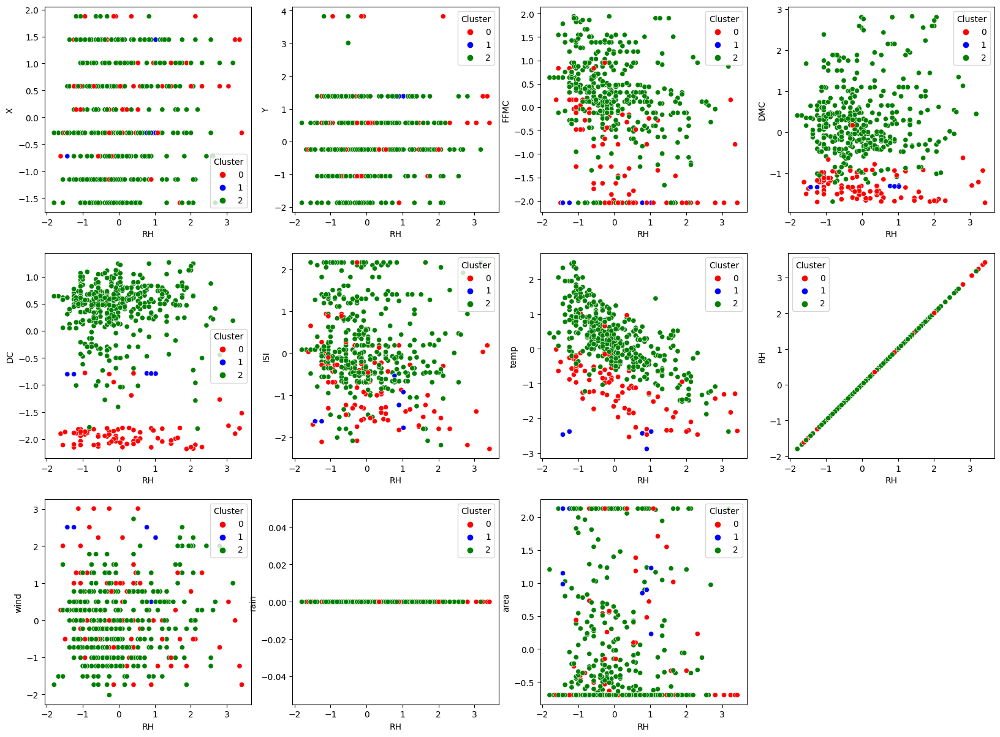

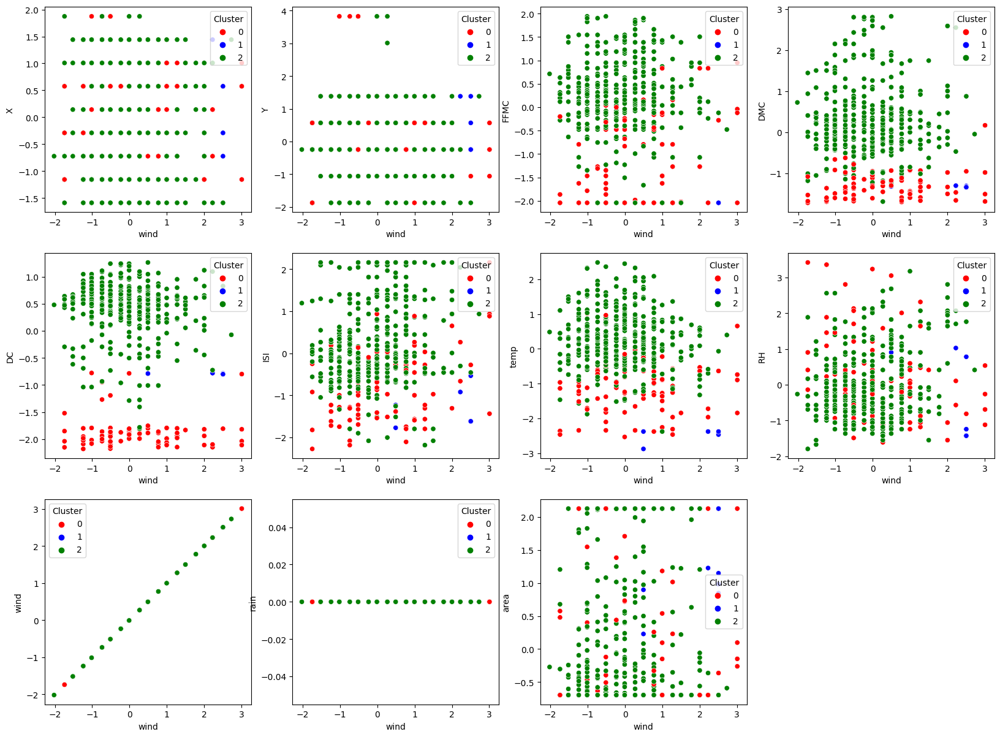

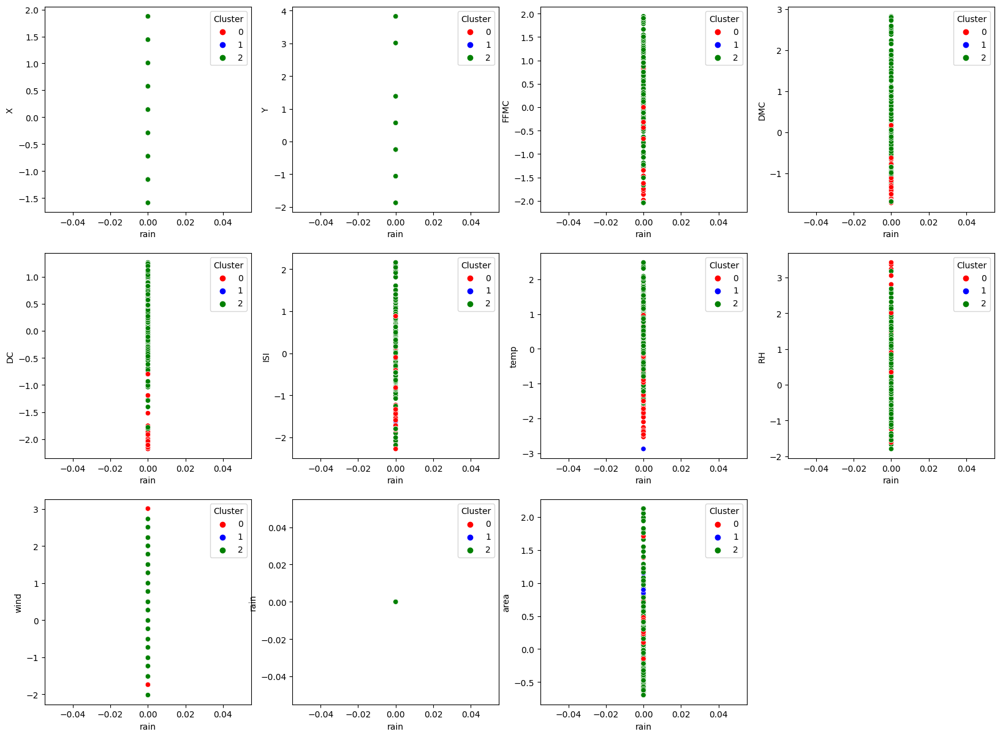

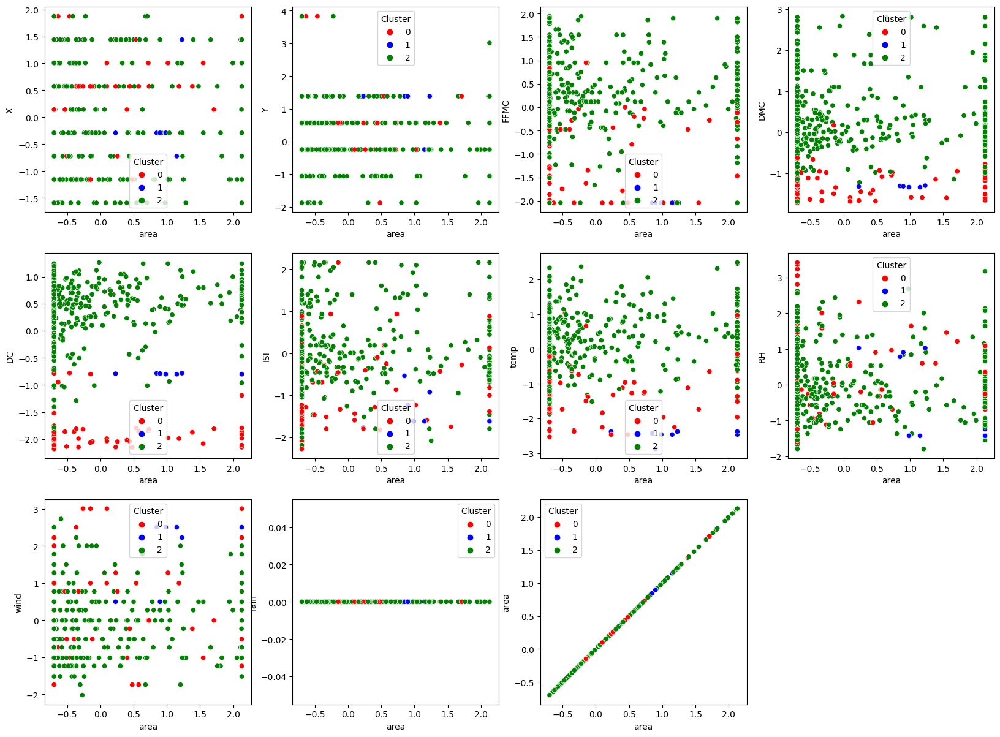

In [186]:
#plotting the whole scatter plots after clustering 

for column_x in df_forest_f_scaled.columns:
    if column_x == "Cluster":
        pass
    else:
        plt.figure(figsize=(20,20))
        i=1
        for column_y in numerical_columns:
            if column_y == "Cluster":
                pass
            else:
                plt.subplot(4,4,i)
                sns.scatterplot(x = column_x, y = column_y, data = df_forest_f_scaled, hue = 'Cluster', palette=['red','blue', 'green'])
                i = i+1

#### As per the pdist I would say that linkage method "Average" and "Centroid" gives the best clusterping 

#### With the help of this values I have created a cluster using AgglomerativeClustering with 3 clusters

#### While scattering the DC and Area columns I would say it was clustered as expected........